<a href="https://colab.research.google.com/github/Champzzz/test/blob/main/Animal_Images_Classification_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import tensorflow as tf

print("TensorFlow version:", tf.__version__)
print("CUDA enabled:", tf.test.is_built_with_cuda())
print("GPU available:", tf.config.list_physical_devices('GPU'))


TensorFlow version: 2.18.0
CUDA enabled: True
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

import os
import random
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.utils import image_dataset_from_directory
from keras.optimizers import Adam

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
dataset = keras.utils.image_dataset_from_directory(
    directory = '/content/drive/MyDrive/dataset',
    labels='inferred',
    label_mode='int',
    batch_size=32,
    image_size=(256, 256),
)

Found 1964 files belonging to 15 classes.


In [6]:

dataset_size = len(dataset)
train_size = int(0.8 * dataset_size)
val_size = dataset_size - train_size

train_ds = dataset.take(train_size)
val_ds = dataset.skip(train_size).take(val_size)

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [7]:

def dataset_to_tensors(dataset):
    images = []
    labels = []
    for img, lbl in dataset.unbatch():
        images.append(img.numpy())
        labels.append(lbl.numpy())
    return tf.convert_to_tensor(images), tf.convert_to_tensor(labels)

In [8]:
x_train, y_train = dataset_to_tensors(train_ds)
x_test, y_test = dataset_to_tensors(val_ds)

[]

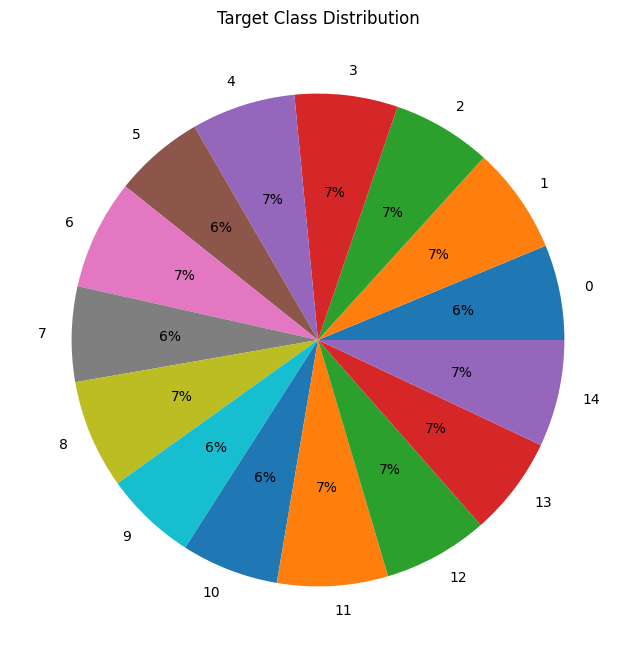

In [9]:
import os
unique, count=np.unique(y_train, return_counts=True)
plt.figure(figsize=(10, 8))
plt.pie(count, labels=unique, autopct='%.0f%%')
plt.title('Target Class Distribution')
plt.plot()

In [10]:

def visualize_images(path, num_images=5):

    image_filenames = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]


    selected_images = random.sample(image_filenames, min(num_images, len(image_filenames)))

    fig, axes = plt.subplots(1, num_images, figsize=(15, 3), facecolor='white')

    for i, image_filename in enumerate(selected_images):
        image_path = os.path.join(path, image_filename)
        image = plt.imread(image_path)

        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(image_filename)

    plt.tight_layout()
    plt.show()

In [11]:
classes = dataset.class_names
print(f'{classes}')

['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']


BEAR


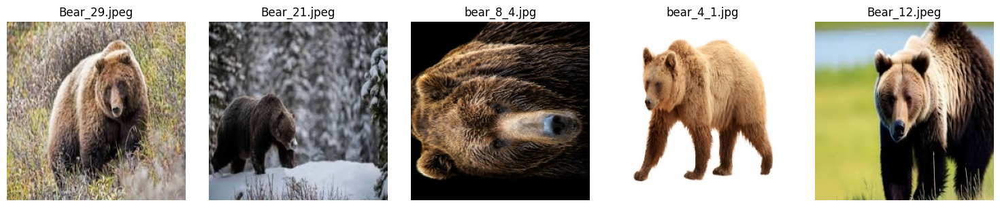

BIRD


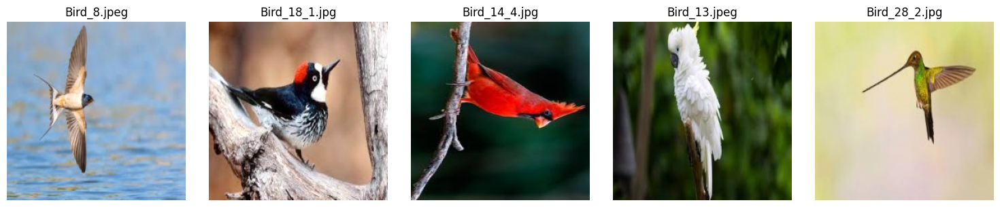

CAT


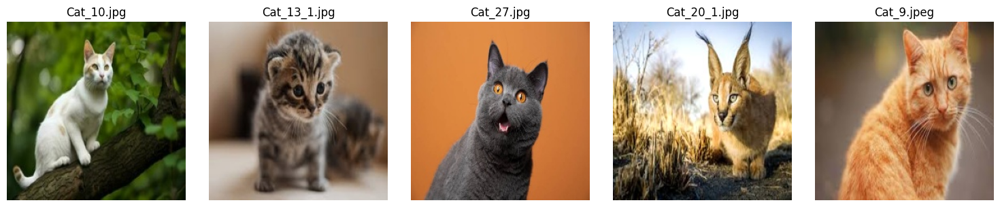

COW


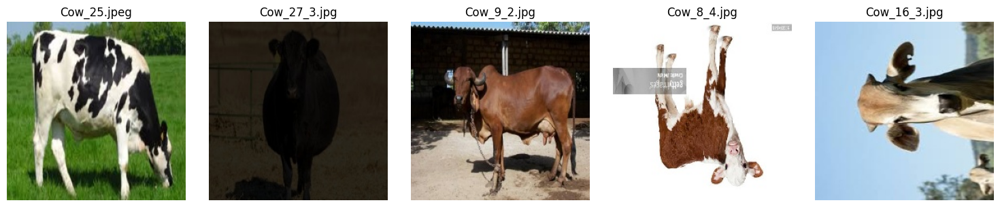

DEER


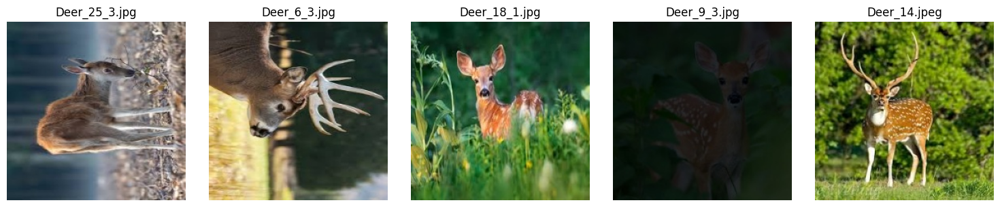

DOG


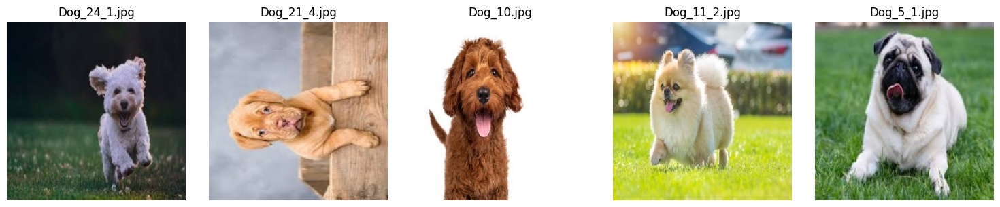

DOLPHIN


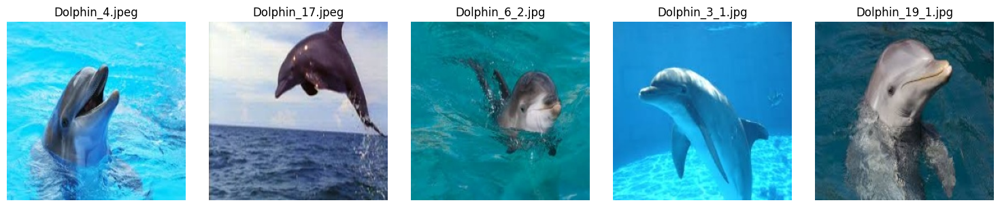

ELEPHANT


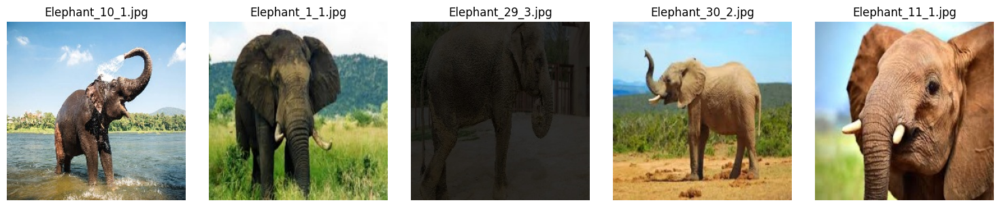

GIRAFFE


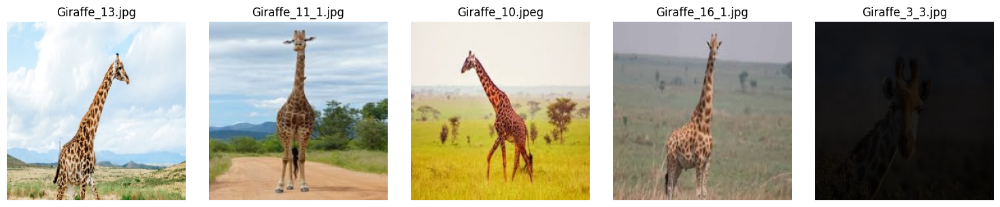

HORSE


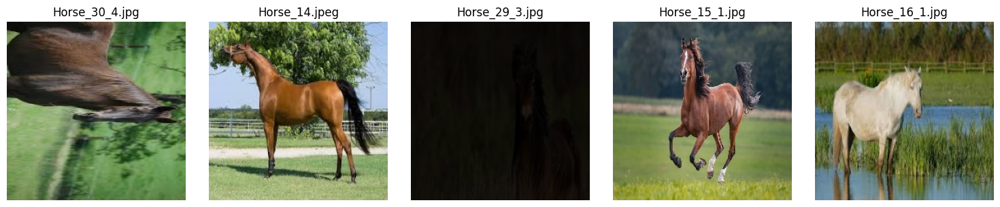

KANGAROO


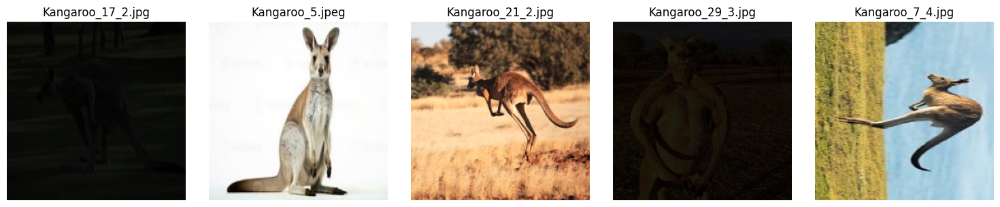

LION


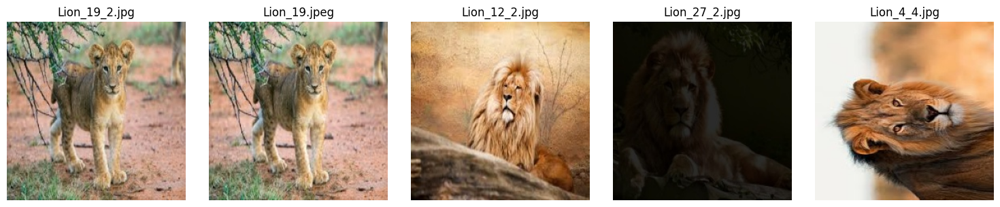

PANDA


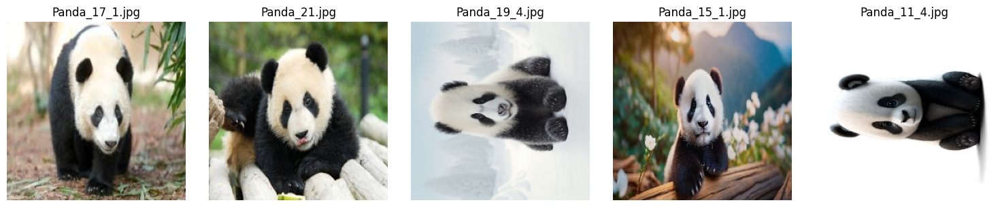

TIGER


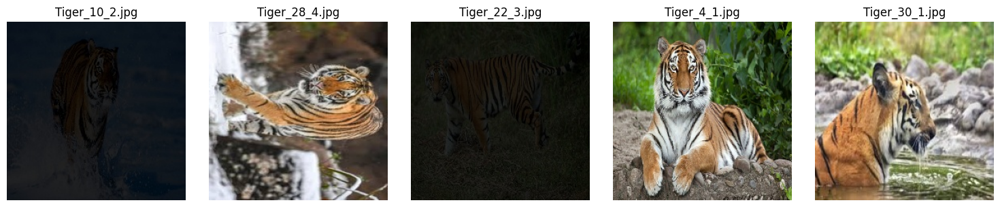

ZEBRA


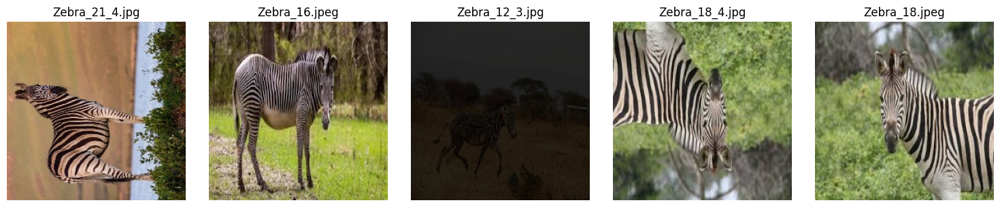

In [12]:
import os
for label in classes:
    path_to_visualize = os.path.join("/content/drive/MyDrive/dataset",label)

    print(label.upper())
    visualize_images(path_to_visualize, num_images=5)

## **Min-Max Scalling**

In [13]:
x_train = tf.cast(x_train, tf.float32)
x_test = tf.cast(x_test, tf.float32)

x_train /= 255.0
x_test /= 255.0

print("X_train shape: {} \nY_train shape: {}".format(x_train.shape, y_train.shape))
print("X_test shape: {} \nY_test shape: {}".format(x_test.shape, y_test.shape))

X_train shape: (1568, 256, 256, 3) 
Y_train shape: (1568,)
X_test shape: (396, 256, 256, 3) 
Y_test shape: (396,)


# **Processing the Target variable**

In [14]:
from tensorflow.keras.utils import to_categorical
y_train = to_categorical(y_train, 15)
y_test = to_categorical(y_test, 15)

In [15]:
y_train[3]

<tf.Tensor: shape=(15,), dtype=float32, numpy=
array([0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)>

### Define CNN Architecture

In [16]:
model = Sequential()

model.add(Conv2D(92, (3, 3), activation='relu', input_shape=(256, 256, 3)))
model.add(BatchNormalization())

model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(84, (3, 3), activation='relu'))
model.add(BatchNormalization())

model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())

model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))





model.add(Conv2D(54, (3, 3), activation='relu'))
model.add(BatchNormalization())

model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))


model.add(Conv2D(54, (3, 3), activation='relu'))
model.add(BatchNormalization())

model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))


model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())

model.add(MaxPooling2D((2, 2)))
model.add(Dropout(0.25))




model.add(Flatten())

model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))


model.add(Dense(15, activation='softmax'))

In [17]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 92)   │         2,576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 254, 254, 92)   │           368 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 92)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 127, 127, 92)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 84)   │        69,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 125, 125, 84)   │           336 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 84)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 62, 62, 84)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 64)     │        48,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 60, 60, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 54)     │        31,158 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 54)     │           216 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 54)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 14, 14, 54)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 12, 12, 54)     │        26,298 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 12, 12, 54)     │           216 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 6, 6, 54)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 6, 6, 54)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 4, 4, 64)       │        31,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 4, 4, 64)       │           256 │
│ (BatchNormalization)            │                        │             

 Total params: 263,299 (1.00 MB)

 Trainable params: 261,963 (1023.29 KB)

 Non-trainable params: 1,336 (5.22 KB)

In [20]:
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


In [21]:
history = model.fit(x_train, y_train, batch_size=32, epochs=120,
          validation_data=(x_test, y_test))

Epoch 1/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 43s 380ms/step - accuracy: 0.0633 - loss: 3.9969 - val_accuracy: 0.0657 - val_loss: 2.7490
Epoch 2/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - accuracy: 0.1082 - loss: 3.5502 - val_accuracy: 0.0808 - val_loss: 2.8474
Epoch 3/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - accuracy: 0.1103 - loss: 3.2969 - val_accuracy: 0.0707 - val_loss: 3.0102
Epoch 4/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - accuracy: 0.1455 - loss: 3.1447 - val_accuracy: 0.0707 - val_loss: 3.0516
Epoch 5/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - accuracy: 0.1471 - loss: 2.9388 - val_accuracy: 0.0606 - val_loss: 3.0699
Epoch 6/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - accuracy: 0.1701 - loss: 2.7255 - val_accuracy: 0.0682 - val_loss: 3.0456
Epoch 7/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - accuracy: 0.1999 - loss: 2.6354 - val_accuracy: 0.0808 - val_loss: 3.0460
Epoch 8/120
49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - accuracy: 0.1827 - loss: 2.6054 - val_

In [22]:
loss, accuracy = model.evaluate(x_test, y_test)
print('Test accuracy:', accuracy)

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.7936 - loss: 0.7567
Test accuracy: 0.7727272510528564


In [23]:
pred = model.predict(x_test)


13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 131ms/step


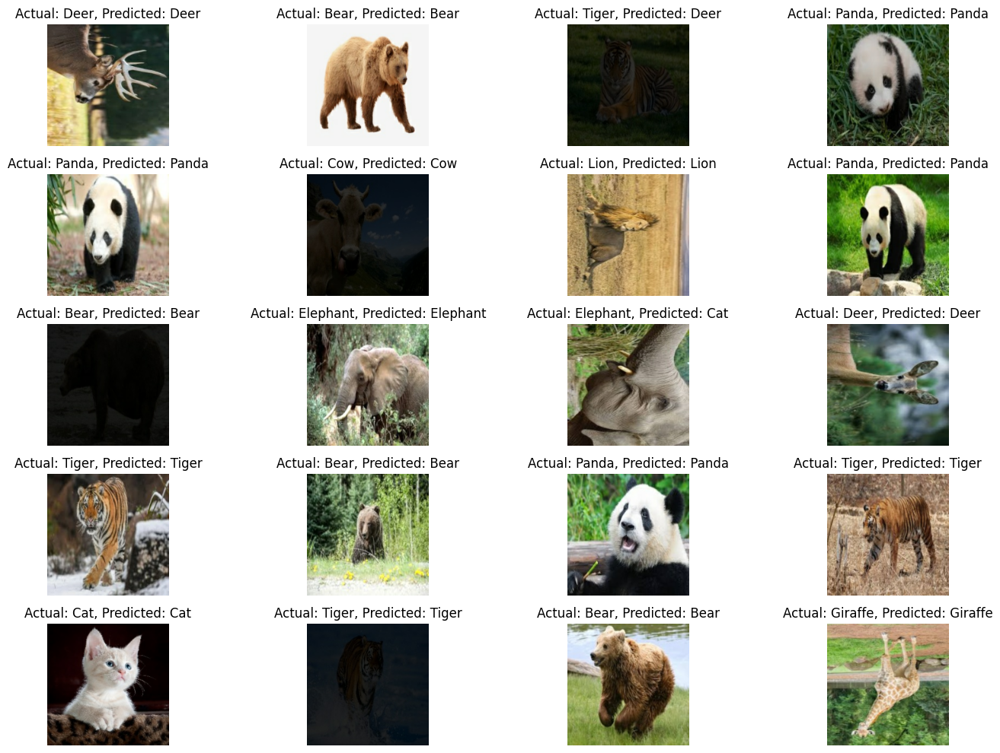

In [24]:

num_images_to_display = 20
num_columns = 4
num_rows = (num_images_to_display + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 10))
for i, ax in enumerate(axes.flat):
    if i < num_images_to_display:
        ax.imshow(x_test[i])
        actual_label = classes[np.argmax(y_test[i])]
        predicted_label = classes[np.argmax(pred[i])]
        ax.set_title(f"Actual: {actual_label}, Predicted: {predicted_label}")
        ax.axis('off')
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

# **Plotting the Graph**


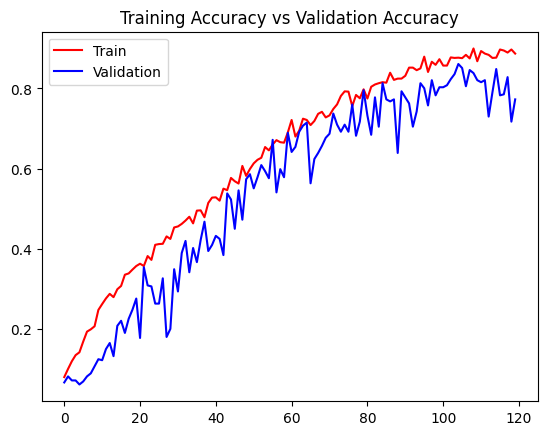

In [25]:
plt.title('Training Accuracy vs Validation Accuracy')

plt.plot(history.history['accuracy'], color='red',label='Train')
plt.plot(history.history['val_accuracy'], color='blue',label='Validation')

plt.legend()

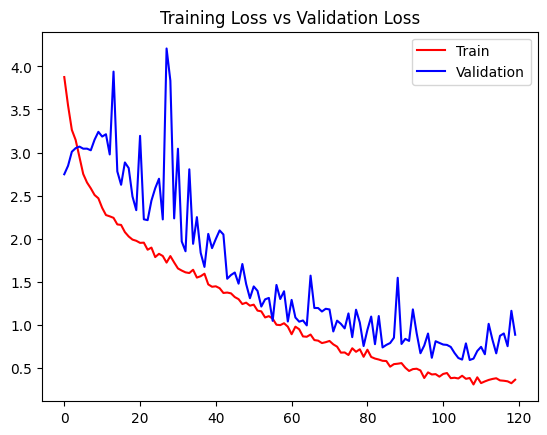

In [26]:
plt.title('Training Loss vs Validation Loss')

plt.plot(history.history['loss'], color='red',label='Train')
plt.plot(history.history['val_loss'], color='blue',label='Validation')

plt.legend()